# Zomato_Restaurant_Project

Project Description
Zomato Data Analysis is one of the most useful analysis for foodies who want to taste the best
cuisines of every part of the world which lies in their budget. This analysis is also for those who
want to find the value for money restaurants in various parts of the country for the cuisines.
Additionally, this analysis caters the needs of people who are striving to get the best cuisine of
the country and which locality of that country serves that cuisines with maximum number of
restaurants.

Data Storage:
    
This problem statement contains two datasets- Zomato.csv and country_code.csv.

Country_code.csv contains two variables:
• Country code
• Country name

The collected data has been stored in the Comma Separated Value file Zomato.csv. Each
restaurant in the dataset is uniquely identified by its Restaurant Id. Every Restaurant contains the following variables:

• Restaurant Id: Unique id of every restaurant across various cities of the world

• Restaurant Name: Name of the restaurant

• Country Code: Country in which restaurant is located

• City: City in which restaurant is located

• Address: Address of the restaurant

• Locality: Location in the city

• Locality Verbose: Detailed description of the locality

• Longitude: Longitude coordinate of the restaurant&#39;s location

• Latitude: Latitude coordinate of the restaurant&#39;s location

• Cuisines: Cuisines offered by the restaurant

• Average Cost for two: Cost for two people in different currencies ��

• Currency: Currency of the country

• Has Table booking: yes/no

• Has Online delivery: yes/ no

• Is delivering: yes/ no

• Switch to order menu: yes/no

• Price range: range of price of food

• Aggregate Rating: Average rating out of 5

• Rating color: depending upon the average rating color

• Rating text: text on the basis of rating of rating

• Votes: Number of ratings casted by people

Problem statement : In this dataset predict 2 things –
1) Average Cost for two
2) Price range


Hint : Use pandas methods to combine all the datasets and then start working on this project.


In [369]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [370]:
from imblearn.over_sampling import SMOTE

In [371]:
#loading the dataset

df1 = pd.read_csv('https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Z_Restaurant/zomato.csv',sep=',', encoding='latin-1')
df1

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [372]:
df2 = pd.read_excel("Country-Code.xlsx")
df2

,Country Code,Country
0,1,India
1,14,Australia
2,30,Brazil
3,37,Canada
4,94,Indonesia
5,148,New Zealand
6,162,Phillipines
7,166,Qatar
8,184,Singapore
9,189,South Africa


In [373]:
pd.set_option('display.max_columns',None)

In [374]:
df = pd.merge(df1, df2, on='Country Code', how='left')
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788,Turkey
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034,Turkey
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661,Turkey
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901,Turkey


In [375]:

print("Columns :",df.columns) #checking the columns or features names
print("shape:", df.shape) #checking the size of the datasets( rows and columns)
print("info:", df.info()) #checking the info( datatypes of columns, null or not null)
print("data types:", df.dtypes) # checking the datatypes of the columns

Columns : Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes', 'Country'],
      dtype='object')
shape: (9551, 22)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null 

In [376]:
#Checking for the null values
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
Country                 0
dtype: int64

null values are present in Cuisines Column.

In [377]:
df['Cuisines'].value_counts()

Cuisines
North Indian                                             936
North Indian, Chinese                                    511
Chinese                                                  354
Fast Food                                                354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                         1
North Indian, Rajasthani, Asian                            1
Chinese, Thai, Malaysian, Indonesian                       1
Bakery, Desserts, North Indian, Bengali, South Indian      1
Italian, World Cuisine                                     1
Name: count, Length: 1825, dtype: int64

In [378]:
from sklearn.impute import SimpleImputer

In [379]:
#Removing null values in the object column

df['Cuisines']=df['Cuisines'].fillna(df['Cuisines'].mode()[0])

In [380]:
df['Cuisines'].value_counts()

Cuisines
North Indian                                             945
North Indian, Chinese                                    511
Chinese                                                  354
Fast Food                                                354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                         1
North Indian, Rajasthani, Asian                            1
Chinese, Thai, Malaysian, Indonesian                       1
Bakery, Desserts, North Indian, Bengali, South Indian      1
Italian, World Cuisine                                     1
Name: count, Length: 1825, dtype: int64

In [381]:
#Again checking for the null values
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
Country                 0
dtype: int64

<Axes: >

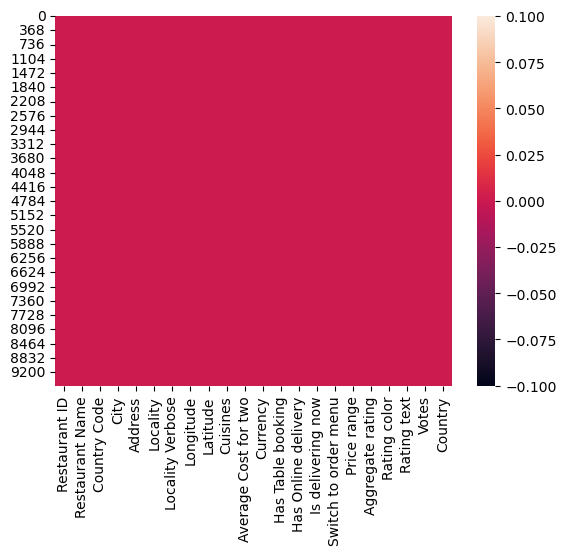

In [382]:
sns.heatmap(df.isnull())  #checking the null values in columns by using heatmap 

No null Values are present now.

In [383]:
# checking the missing value in each column
positions = df.isin(['?'])
count_per_column = positions.sum(axis=0)
print("\nCount of '?' in each column:")
print(count_per_column)


Count of '?' in each column:
Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
Country                 0
dtype: int64


No missing Values are present in the dataset

In [384]:
# checking the duplicate values
df.duplicated().sum()

0

No duplicate values are present in the dataset.

In [385]:
# checking the existence of any whitespace,NA and - values
df.isin([' ','NA','-']).sum().any()

False

there are not any kind of whitespace,NA and - values in the dataset.

In [386]:
# checking the value counts of each column
for i in df.columns:
    print(df[i].value_counts())
    print("\n")

Restaurant ID
6317637     1
18254520    1
18462589    1
18336474    1
18336477    1
           ..
313059      1
763         1
7557        1
525         1
5927402     1
Name: count, Length: 9551, dtype: int64


Restaurant Name
Cafe Coffee Day             83
Domino's Pizza              79
Subway                      63
Green Chick Chop            51
McDonald's                  48
                            ..
Odeon Social                 1
Johnny Rockets               1
House of Commons             1
HotMess                      1
Walter's Coffee Roastery     1
Name: count, Length: 7446, dtype: int64


Country Code
1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: count, dtype: int64


City
New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula      

In [387]:
df.nunique().to_frame("no. of unique values")  # no. of unique values in all columns of the Dataframe

,no. of unique values
Restaurant ID,9551
Restaurant Name,7446
Country Code,15
City,141
Address,8918
Locality,1208
Locality Verbose,1265
Longitude,8120
Latitude,8677
Cuisines,1825


Observations: 
1.Restaurant ID have different value for every different entries i.e. 9551. So we have to drop this column.
2.According to this dataset, "Switch to order menu" column have only 1 value for total dataset. Let's drop it. 

In [388]:
df.drop(["Restaurant ID", 'Switch to order menu'], axis=1, inplace= True)


In [389]:
#seperating the numerical and categorical columns
#Categorical columns
categorical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=="object":
        categorical_col.append(i)
print("categorical columns:",categorical_col)

categorical columns: ['Restaurant Name', 'City', 'Address', 'Locality', 'Locality Verbose', 'Cuisines', 'Currency', 'Has Table booking', 'Has Online delivery', 'Is delivering now', 'Rating color', 'Rating text', 'Country']


In [390]:
#Numerical columns
numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!="object":
        numerical_col.append(i)
print("numerical columns:",numerical_col)
print("\n")

numerical columns: ['Country Code', 'Longitude', 'Latitude', 'Average Cost for two', 'Price range', 'Aggregate rating', 'Votes']




# Data Visualization

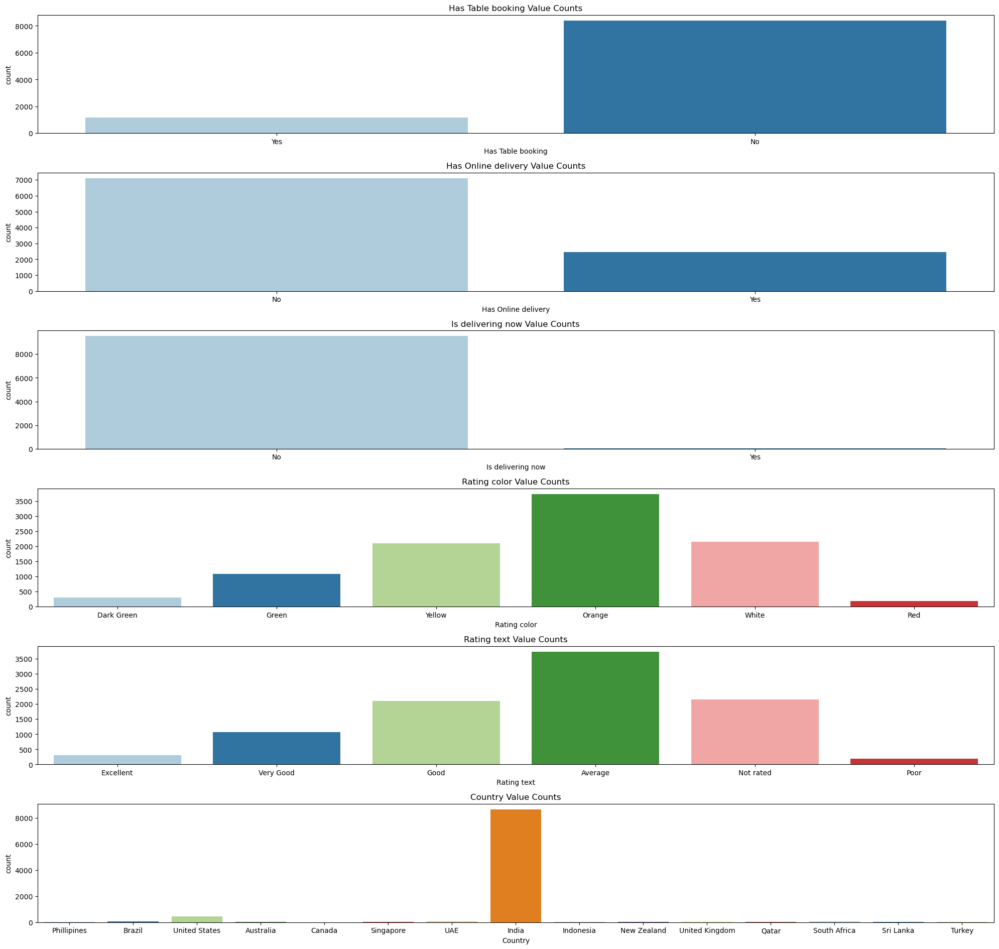

In [391]:
list1=['Has Table booking', 'Has Online delivery', 'Is delivering now', 'Rating color', 'Rating text', 'Country']
plt.figure(figsize=(20, 50 ))
plotnumber=1
for i in list1:
    if plotnumber<=16:
        plt.subplot(16, 1, plotnumber)
        sns.countplot(x=df[i],palette='Paired')
        plt.title(f'{i} Value Counts')
        plt.xlabel(i)
    plotnumber+=1
plt.tight_layout()
plt.show()

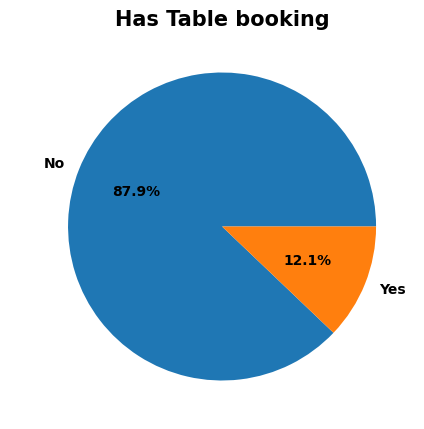

In [392]:
plt.subplots(figsize=(8,5))
df['Has Table booking'].value_counts().plot.pie(autopct='%2.1f%%', textprops ={ 'fontweight': 'bold','fontsize':10})
plt.title('Has Table booking', fontsize=15,fontweight ='bold')
plt.ylabel( ' ')
plt.show()

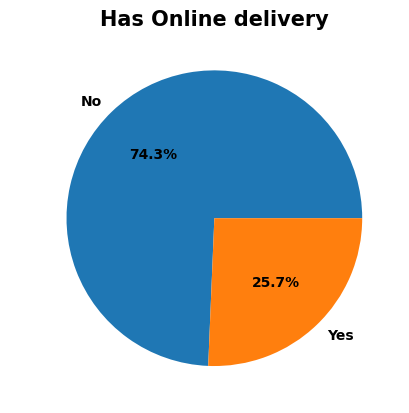

In [393]:
df['Has Online delivery'].value_counts().plot.pie(autopct='%2.1f%%', textprops ={ 'fontweight': 'bold','fontsize':10})
plt.title('Has Online delivery', fontsize=15,fontweight ='bold')
plt.ylabel( ' ')
plt.show()

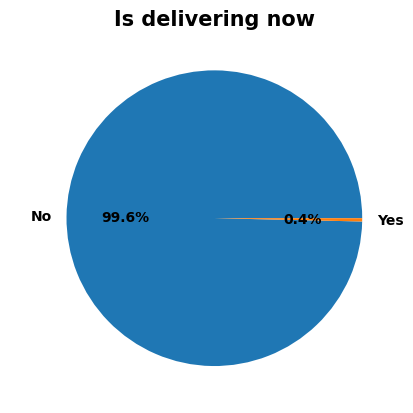

In [394]:
df['Is delivering now'].value_counts().plot.pie(autopct='%2.1f%%', textprops ={ 'fontweight': 'bold','fontsize':10})
plt.title('Is delivering now', fontsize=15,fontweight ='bold')
plt.ylabel( ' ')
plt.show()

Observations: 
    1. Less no. i.e. 1158 (12.1%) of restaurant has table booking compared than the restaurant has no table booking 8393 (87.9%).
    2. Less no. i.e. 2451 (25.7%) of restaurant has online booking compared than the restaurant has no online booking 7100 (74.3%).
    3. more no. i.e.  99.6% of restaurant is not delivering now compared than the .4% restaurant is delivering now.
    4. Around 40% Rating color is Orange. 
    5. Maximum Rating text is Average.

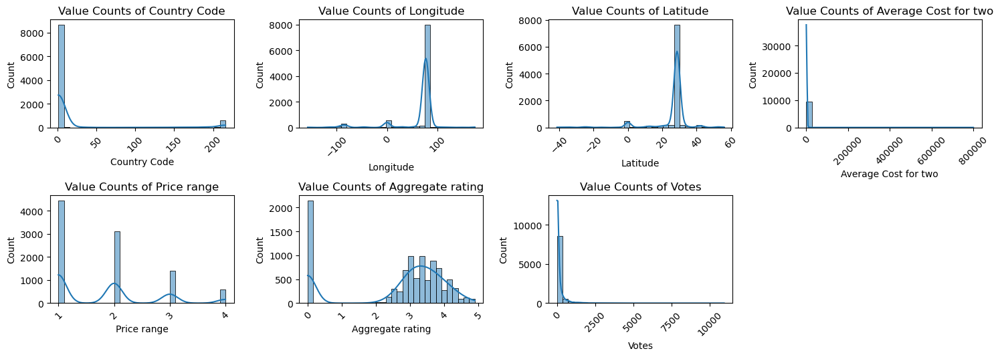

In [395]:
plt.figure(figsize=(15,10))
plotnumber=1    
for i in numerical_col:
    if plotnumber<=16:
        plt.subplot(4, 4, plotnumber)
        sns.histplot(df[i], kde=True, bins=30)
        plt.title(f'Value Counts of {i}')
        plt.xticks(rotation=45)
        plt.xlabel(i)
    plotnumber+=1
plt.tight_layout()
plt.show()

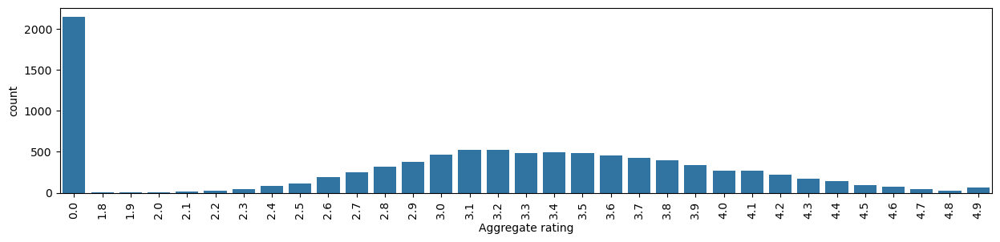

In [396]:
plt.figure(figsize=(15,3))
sns.countplot(x=df["Aggregate rating"])
plt.xticks(rotation=90)
plt.show()

Maximum Aggregate rating count is 0.0.

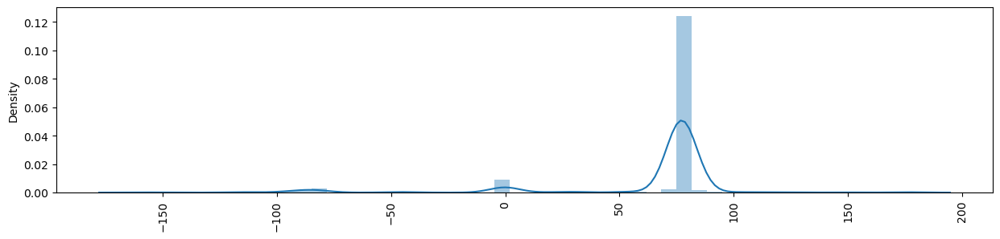

In [397]:
plt.figure(figsize=(15,3))
sns.distplot(x=df["Longitude"])
plt.xticks(rotation=90)
plt.show()

Maximum range of Longitude is between 50 and 100.

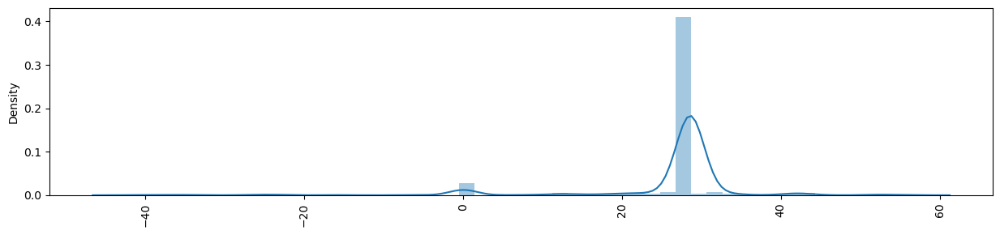

In [398]:
plt.figure(figsize=(15,3))
sns.distplot(x=df["Latitude"])
plt.xticks(rotation=90)
plt.show()

Maximum range of Latitude is between 20 and 40.

# Exploration of Target/Label Variable:

# 1. Price range

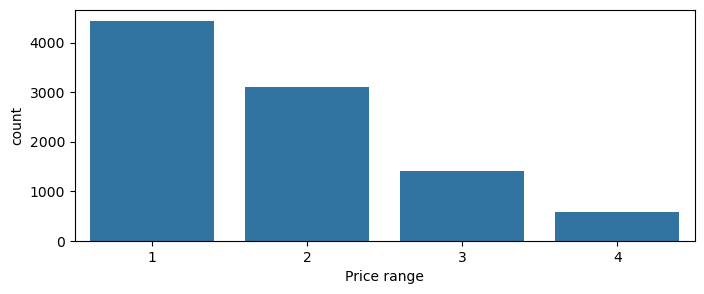

In [399]:
plt.figure(figsize=(8,3))
sns.countplot(x=df["Price range"])
plt.show()

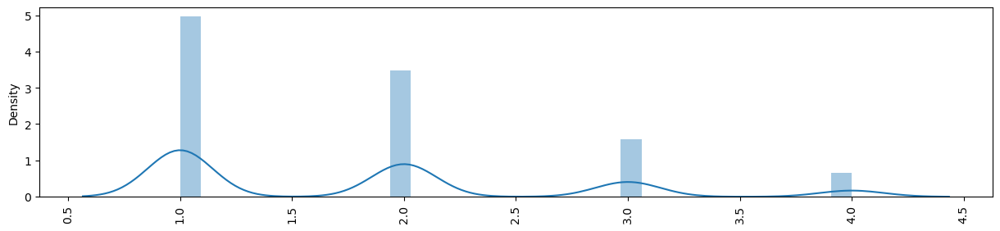

In [400]:
plt.figure(figsize=(15,3))
sns.distplot(x=df["Price range"])
plt.xticks(rotation=90)
plt.show()

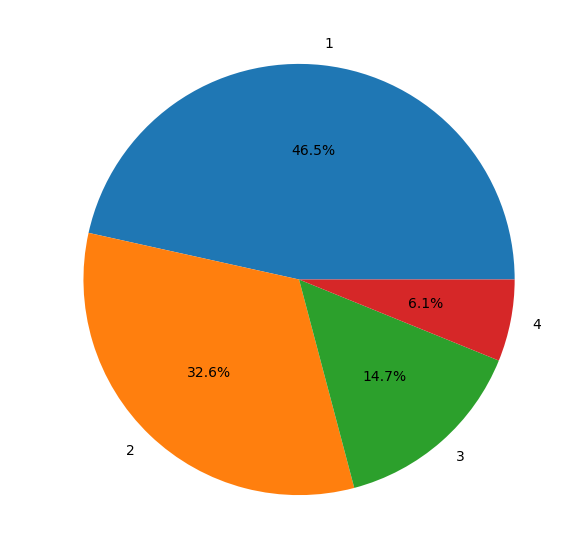

In [401]:
plt.subplots(figsize=(8,7))
df['Price range'].value_counts().plot.pie(autopct='%2.1f%%')
plt.ylabel( ' ')
plt.show()

# 2. Average Cost for two

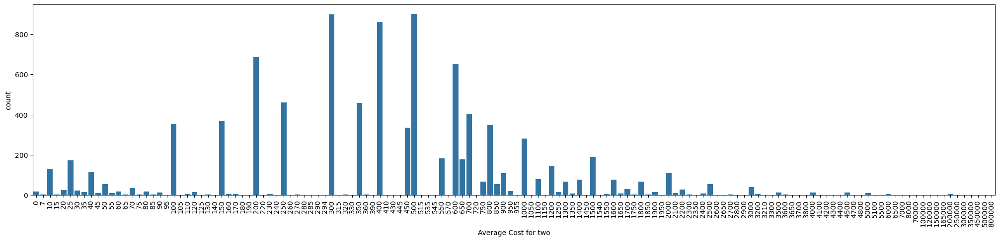

In [402]:
plt.figure(figsize=(25,5))
sns.countplot(x=df["Average Cost for two"])
plt.xticks(rotation=90)
plt.show()

In [403]:

print('Maximum "Average Cost for two" value is:',df['Average Cost for two'].max())
print('Minimum "Average Cost for two" value is:',df['Average Cost for two'].min())
print('Mean "Average Cost for two" value is:',df['Average Cost for two'].mode()[0])

Maximum "Average Cost for two" value is: 800000
Minimum "Average Cost for two" value is: 0
Mean "Average Cost for two" value is: 500


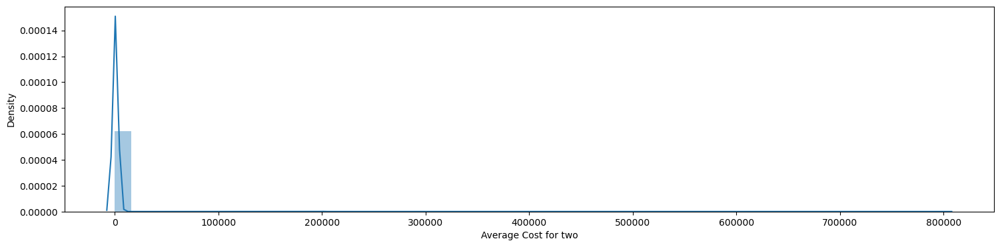

In [404]:
plt.figure(figsize=(18,4))
sns.distplot(data['Average Cost for two'])
plt.show()

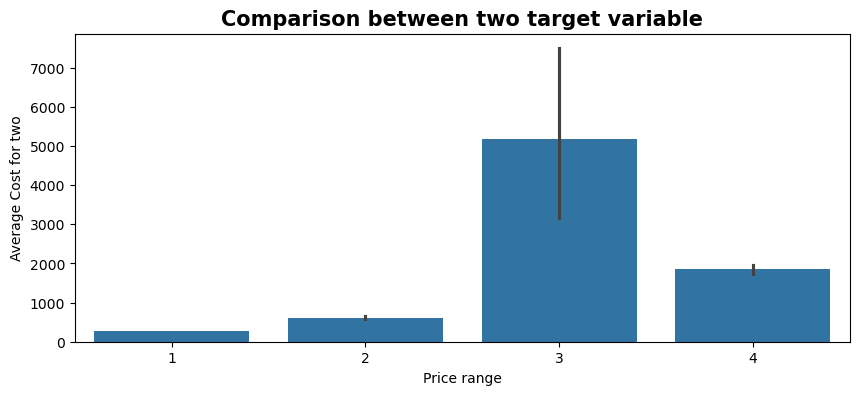

In [405]:
plt.figure(figsize=(10,4))
sns.barplot(y = "Average Cost for two", x= "Price range", data = df)
plt.title('Comparison between two target variable', fontsize=15, fontweight='bold')
plt.show()

1. For Price range 1, there is lowest Average Cost for two.
2. Maximum Average Cost for two is for Price range 3.

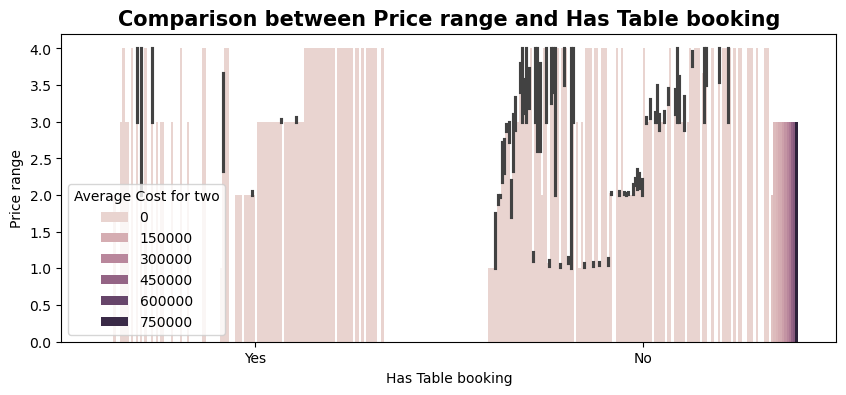

In [406]:
plt.figure(figsize=(10,4))
sns.barplot(y = "Price range", x= "Has Table booking", data = df, hue= 'Average Cost for two')
plt.title('Comparison between Price range and Has Table booking', fontsize=15, fontweight='bold')
plt.show()

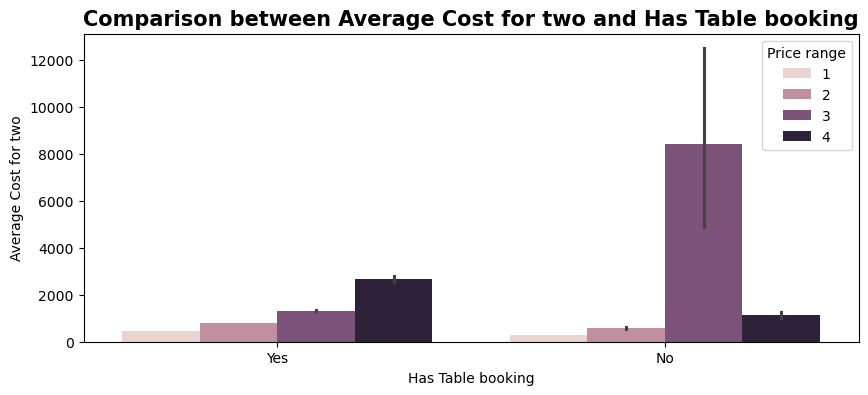

In [407]:
plt.figure(figsize=(10,4))
sns.barplot(y = "Average Cost for two", x= "Has Table booking", data = df, hue= 'Price range')
plt.title('Comparison between Average Cost for two and Has Table booking', fontsize=15, fontweight='bold')
plt.show()

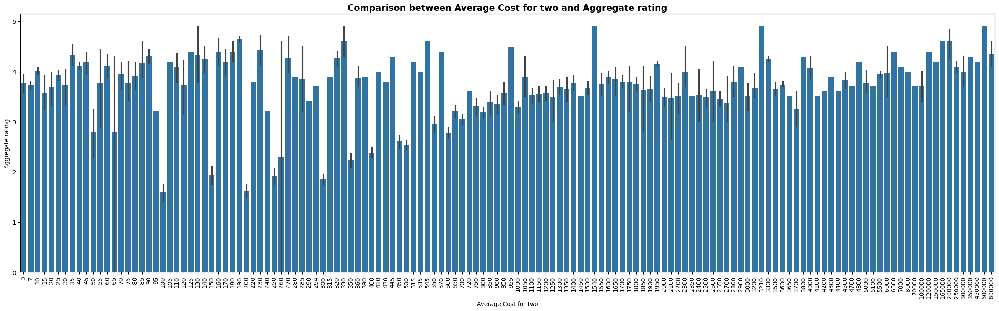

In [408]:
plt.figure(figsize=(30,8))
sns.barplot(x = "Average Cost for two", y = "Aggregate rating", data = df)
plt.title('Comparison between Average Cost for two and Aggregate rating', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

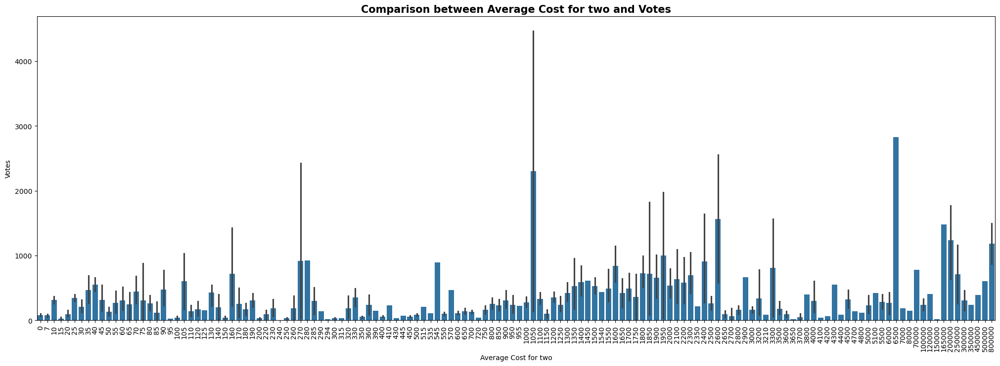

In [409]:
plt.figure(figsize=(25,8))
sns.barplot(x = "Average Cost for two", y = "Votes", data = df)
plt.title('Comparison between Average Cost for two and Votes', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

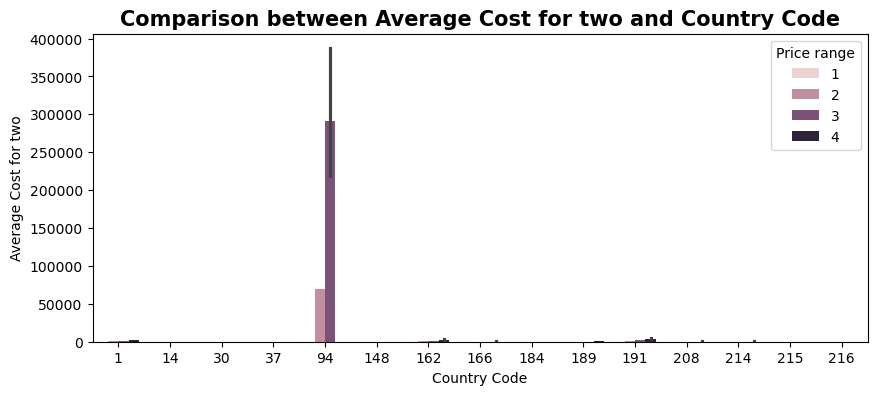

In [410]:
plt.figure(figsize=(10,4))
sns.barplot(y = "Average Cost for two", x= "Country Code", data = df, hue= 'Price range')
plt.title('Comparison between Average Cost for two and Country Code', fontsize=15, fontweight='bold')
plt.show()

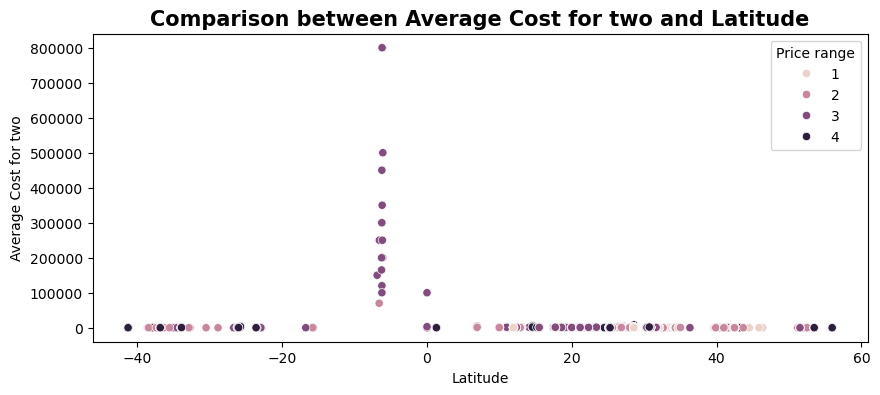

In [411]:
plt.figure(figsize=(10,4))
sns.scatterplot(y = "Average Cost for two", x= "Latitude", data = df, hue= 'Price range')
plt.title('Comparison between Average Cost for two and Latitude', fontsize=15, fontweight='bold')
plt.show()

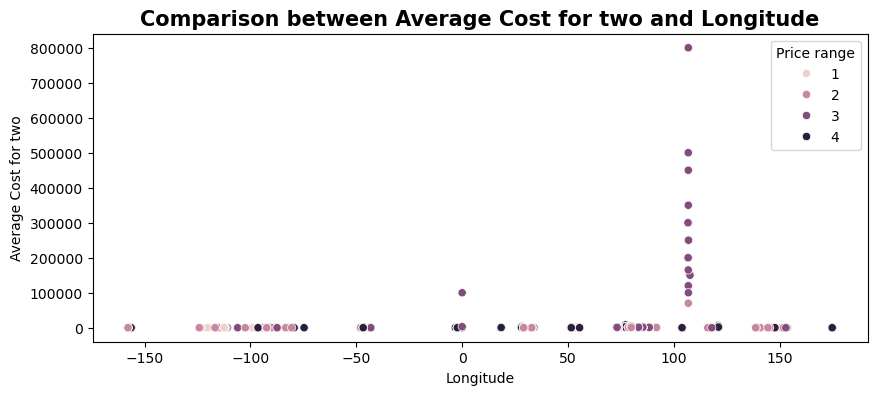

In [412]:
plt.figure(figsize=(10,4))
sns.scatterplot(y = "Average Cost for two", x= "Longitude", data = df, hue= 'Price range')
plt.title('Comparison between Average Cost for two and Longitude', fontsize=15, fontweight='bold')
plt.show()

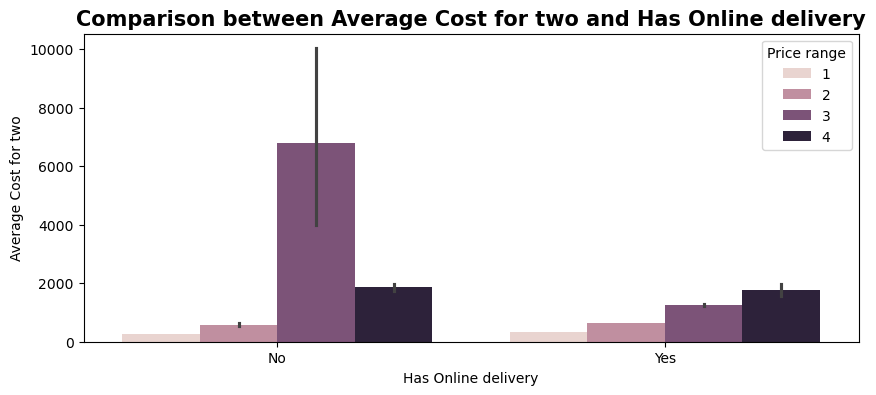

In [413]:
plt.figure(figsize=(10,4))
sns.barplot(y = "Average Cost for two", x= "Has Online delivery", data = df, hue= 'Price range')
plt.title('Comparison between Average Cost for two and Has Online delivery', fontsize=15, fontweight='bold')
plt.show()

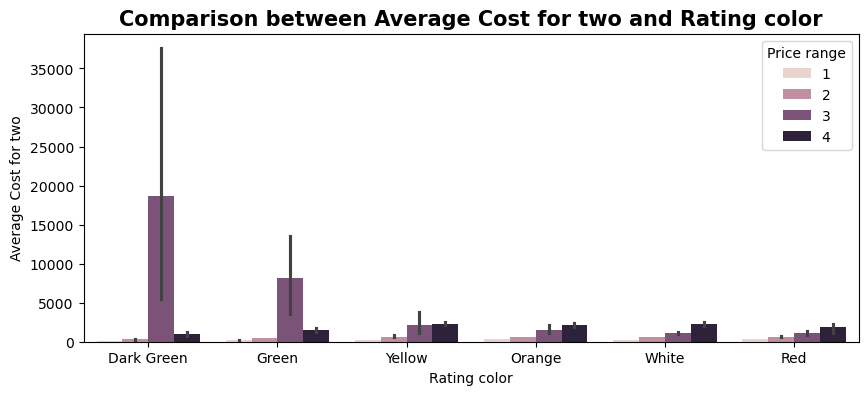

In [414]:
plt.figure(figsize=(10,4))
sns.barplot(y = "Average Cost for two", x= "Rating color", data = df, hue= 'Price range')
plt.title('Comparison between Average Cost for two and Rating color', fontsize=15, fontweight='bold')
plt.show()

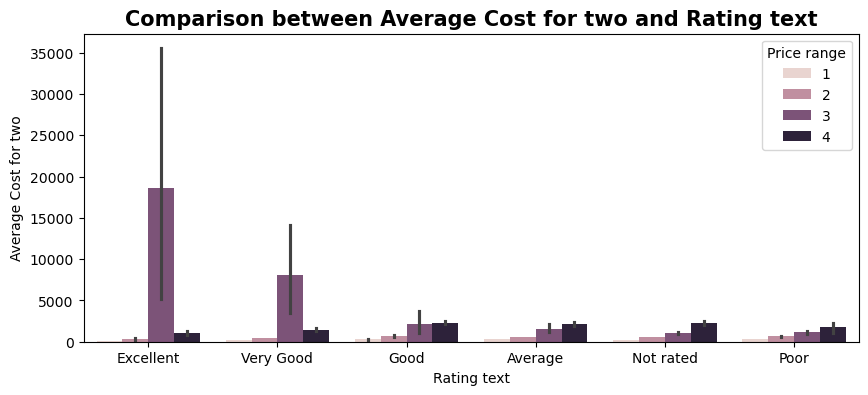

In [415]:
plt.figure(figsize=(10,4))
sns.barplot(y = "Average Cost for two", x= "Rating text", data = df, hue= 'Price range')
plt.title('Comparison between Average Cost for two and Rating text', fontsize=15, fontweight='bold')
plt.show()

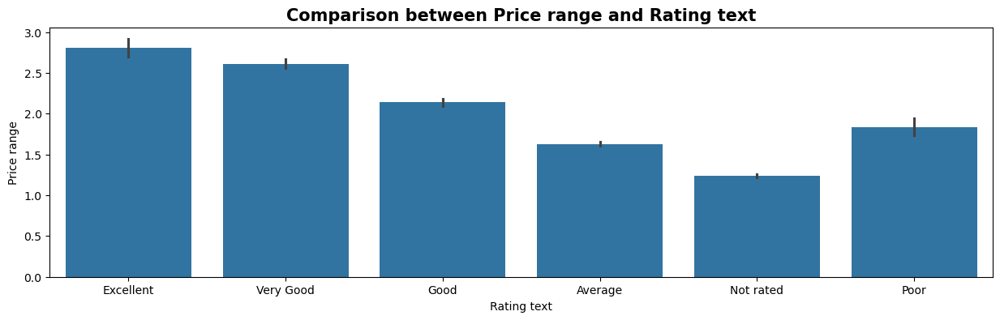

In [416]:
plt.figure(figsize=(15,4))
sns.barplot(y = "Price range", x= "Rating text", data = df)
plt.title('Comparison between Price range and Rating text', fontsize=15, fontweight='bold')
plt.show()

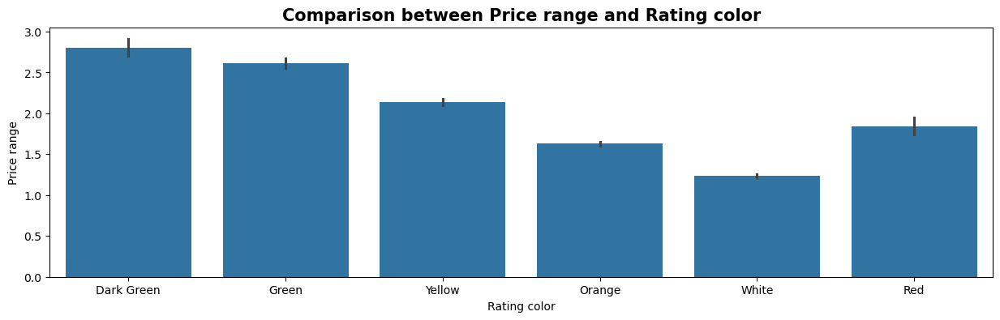

In [417]:
plt.figure(figsize=(15,4))
sns.barplot(y = "Price range", x= "Rating color", data = df)
plt.title('Comparison between Price range and Rating color', fontsize=15, fontweight='bold')
plt.show()

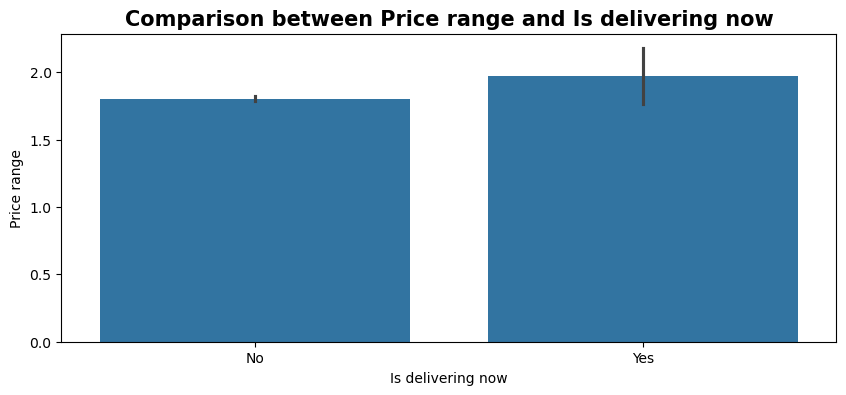

In [418]:
plt.figure(figsize=(10,4))
sns.barplot(y = "Price range", x= "Is delivering now", data = df)
plt.title('Comparison between Price range and Is delivering now', fontsize=15, fontweight='bold')
plt.show()

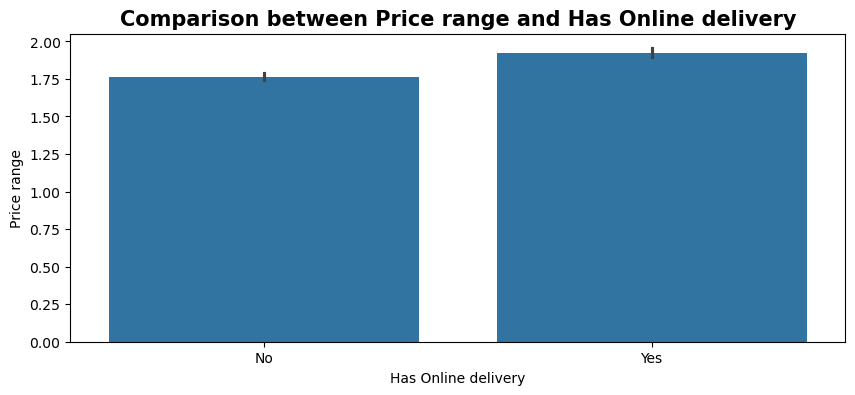

In [419]:
plt.figure(figsize=(10,4))
sns.barplot(y = "Price range", x= "Has Online delivery", data = df)
plt.title('Comparison between Price range and Has Online delivery', fontsize=15, fontweight='bold')
plt.show()

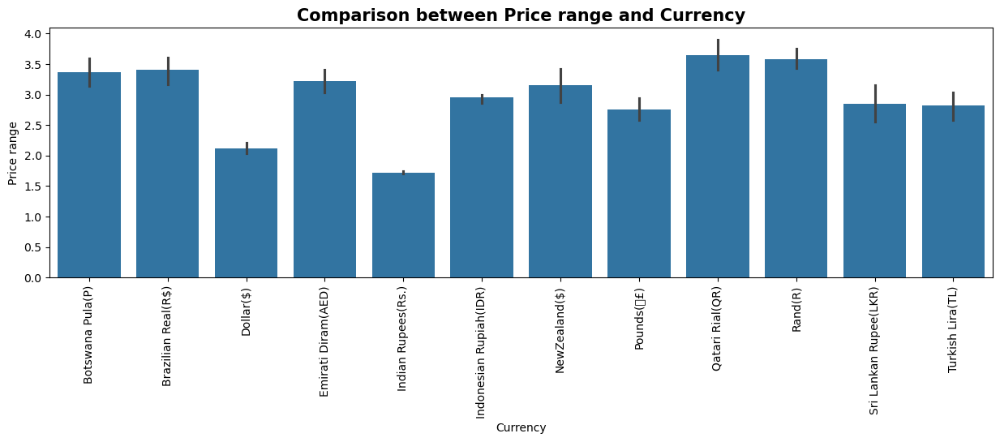

In [420]:
plt.figure(figsize=(15,4))
sns.barplot(y = "Price range", x= "Currency", data = df)
plt.title('Comparison between Price range and Currency', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

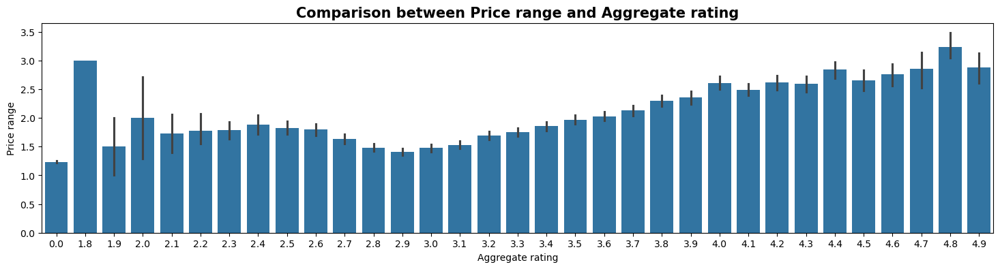

In [421]:
plt.figure(figsize=(18,4))
sns.barplot(y = "Price range", x= "Aggregate rating", data = df)
plt.title('Comparison between Price range and Aggregate rating', fontsize=15, fontweight='bold')
plt.show()

# Encoding for categorical columns by using Label Encoder:

In [422]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in categorical_col:
    df[i]=le.fit_transform(df[i])

In [423]:
df

,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,3749,162,73,8685,171,172,121.027535,14.565443,920,1100,0,1,0,0,3,4.8,0,1,314,6
1,3173,162,73,6055,593,601,121.014101,14.553708,1111,1200,0,1,0,0,3,4.5,0,1,591,6
2,2897,162,75,4684,308,314,121.056831,14.581404,1671,4000,0,1,0,0,4,4.4,1,5,270,6
3,4707,162,75,8690,862,875,121.056475,14.585318,1126,1500,0,0,0,0,4,4.9,0,1,365,6
4,5523,162,75,8689,862,875,121.057508,14.584450,1122,1500,0,1,0,0,4,4.8,0,1,229,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,4443,208,140,5926,517,523,28.977392,41.022793,1813,80,11,0,0,0,3,4.1,1,5,788,11
9547,1311,208,140,5962,552,558,29.041297,41.009847,1824,105,11,0,0,0,3,4.2,1,5,1034,11
9548,3069,208,140,5966,554,561,29.034640,41.055817,1110,170,11,0,0,0,4,3.7,5,2,661,11
9549,513,208,140,5967,554,561,29.036019,41.057979,1657,120,11,0,0,0,4,4.0,1,5,901,11


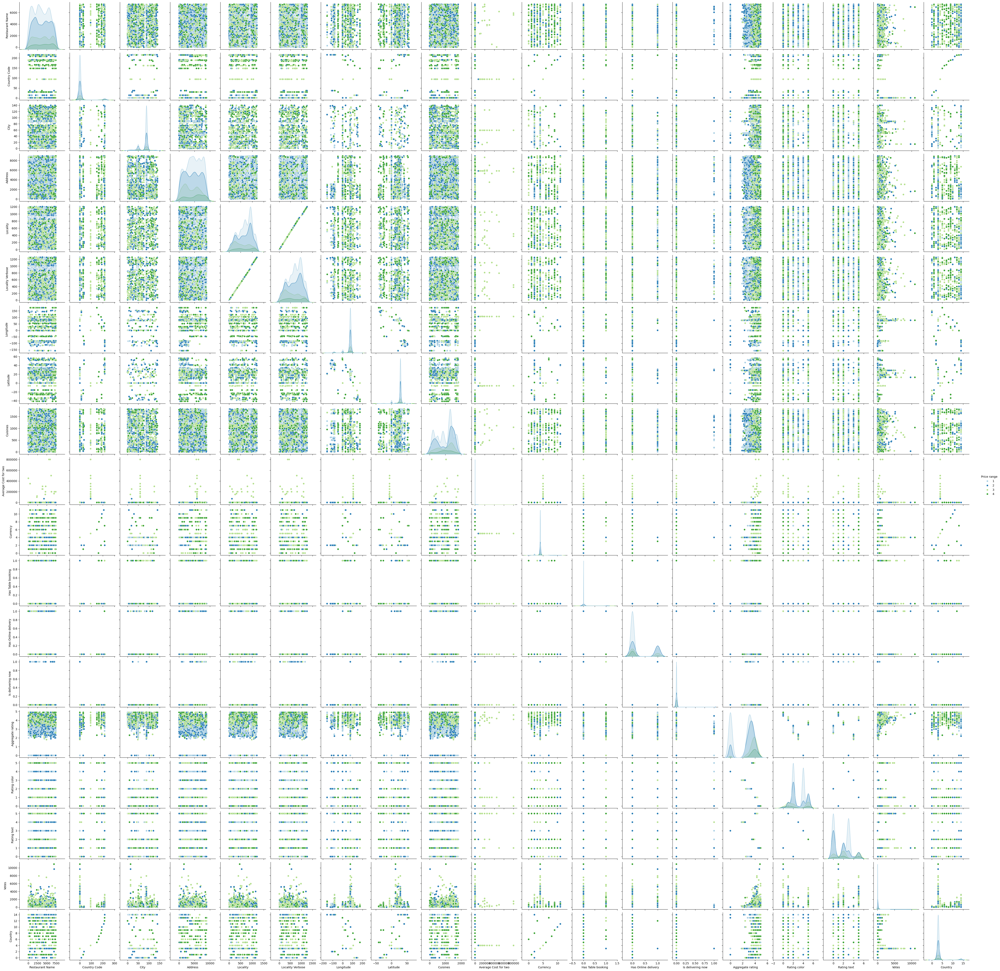

In [424]:
sns.pairplot(df,hue="Price range",palette="Paired" )
plt.show()

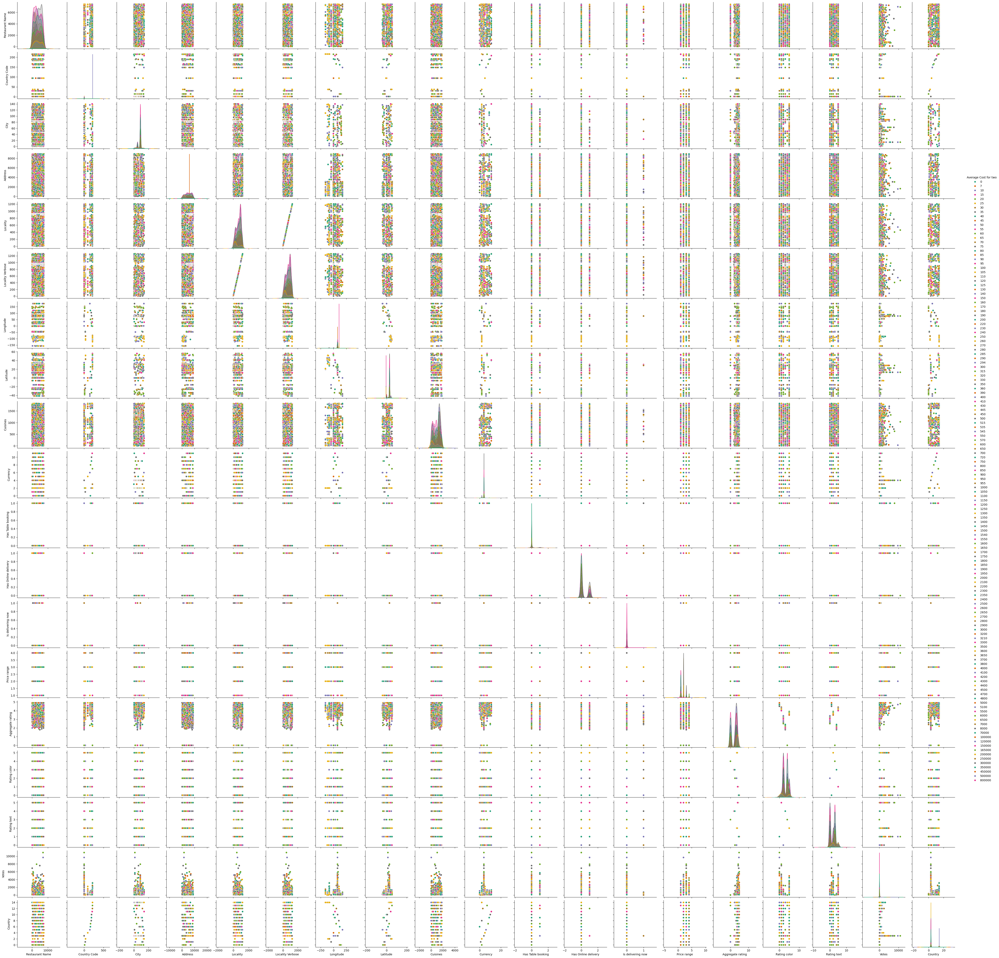

In [425]:
sns.pairplot(df,hue="Average Cost for two",palette="Dark2" )
plt.show()

In [426]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Restaurant Name,9551.0,3653.204586,2142.917876,0.000000,1777.500000,3595.000000,5485.500000,7445.000000
Country Code,9551.0,18.365616,56.750546,1.000000,1.000000,1.000000,1.000000,216.000000
City,9551.0,78.301434,23.198915,0.000000,76.000000,88.000000,88.000000,140.000000
Address,9551.0,4542.439430,2565.717005,0.000000,2323.500000,4610.000000,6746.500000,8917.000000
Locality,9551.0,658.128468,315.866515,0.000000,381.000000,696.000000,921.000000,1207.000000
Locality Verbose,9551.0,677.304994,331.727449,0.000000,387.000000,707.000000,953.000000,1264.000000
Longitude,9551.0,64.126574,41.467058,-157.948486,77.081343,77.191964,77.282006,174.832089
Latitude,9551.0,25.854381,11.007935,-41.330428,28.478713,28.570469,28.642758,55.976980
Cuisines,9551.0,989.461732,514.176108,0.000000,497.000000,1127.000000,1353.500000,1824.000000
Average Cost for two,9551.0,1199.210763,16121.183073,0.000000,250.000000,400.000000,700.000000,800000.000000


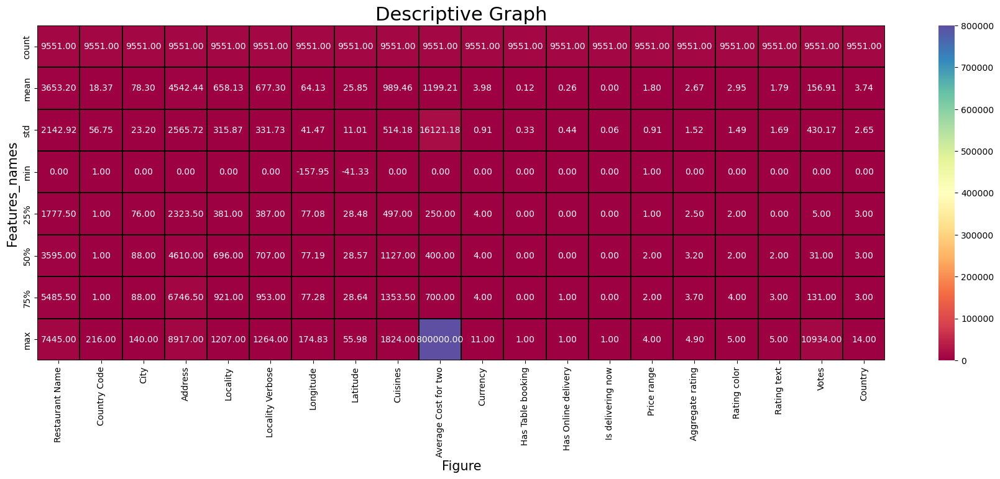

In [427]:
plt.figure(figsize=(22,7))
sns.heatmap(df.describe(),annot=True,fmt='0.2f',linewidth=0.2,linecolor='black',cmap='Spectral')
plt.xlabel('Figure',fontsize=15)
plt.ylabel('Features_names',fontsize=15)
plt.title('Descriptive Graph',fontsize=22)
plt.show()

In [428]:
df.corr()

,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
Restaurant Name,1.000000,0.020012,-0.001399,0.000763,0.004322,0.004281,-0.001920,0.009922,0.051679,0.019241,0.009669,0.041173,0.028082,0.011984,0.061275,0.029367,-0.007311,0.012131,0.018512,0.017560
Country Code,0.020012,1.000000,-0.181728,-0.220342,-0.120075,-0.117543,-0.698299,0.019792,-0.132902,0.043225,-0.033466,-0.061682,-0.154605,-0.018291,0.243327,0.282189,-0.187174,0.222685,0.154530,0.968700
City,-0.001399,-0.181728,1.000000,-0.019763,0.096444,0.093142,0.117391,-0.004301,0.026614,-0.028838,-0.071996,-0.003762,0.012723,-0.014039,-0.105759,-0.132163,0.110887,-0.098985,-0.078406,-0.180959
Address,0.000763,-0.220342,-0.019763,1.000000,0.159555,0.160495,0.185801,-0.038654,0.023944,0.022749,0.069499,0.006428,0.029874,0.031267,-0.034952,-0.151153,0.071264,-0.008029,-0.101754,-0.235815
Locality,0.004322,-0.120075,0.096444,0.159555,1.000000,0.999465,0.086448,-0.020424,0.006993,-0.012136,0.023723,-0.065594,-0.030993,-0.007299,-0.114459,-0.174336,0.036831,-0.036969,-0.123569,-0.118784
Locality Verbose,0.004281,-0.117543,0.093142,0.160495,0.999465,1.000000,0.084342,-0.020905,0.005960,-0.011852,0.022966,-0.065132,-0.031766,-0.007353,-0.112313,-0.173254,0.037104,-0.035430,-0.122877,-0.116406
Longitude,-0.001920,-0.698299,0.117391,0.185801,0.086448,0.084342,1.000000,0.043207,0.126197,0.045891,0.337334,0.100488,0.178757,0.018787,-0.078939,-0.116818,0.059979,-0.181466,-0.085101,-0.766221
Latitude,0.009922,0.019792,-0.004301,-0.038654,-0.020424,-0.020905,0.043207,1.000000,0.038151,-0.111088,-0.101864,0.054658,0.118722,0.015001,-0.166688,0.000516,0.042590,-0.129447,-0.022962,0.181299
Cuisines,0.051679,-0.132902,0.026614,0.023944,0.006993,0.005960,0.126197,0.038151,1.000000,0.005831,0.068912,0.050639,-0.016639,0.007773,-0.005350,-0.080331,-0.016228,-0.079979,-0.032719,-0.127955
Average Cost for two,0.019241,0.043225,-0.028838,0.022749,-0.012136,-0.011852,0.045891,-0.111088,0.005831,1.000000,0.045615,0.007758,-0.018974,-0.001862,0.075083,0.051792,-0.049970,0.031439,0.067783,-0.004034


<Axes: >

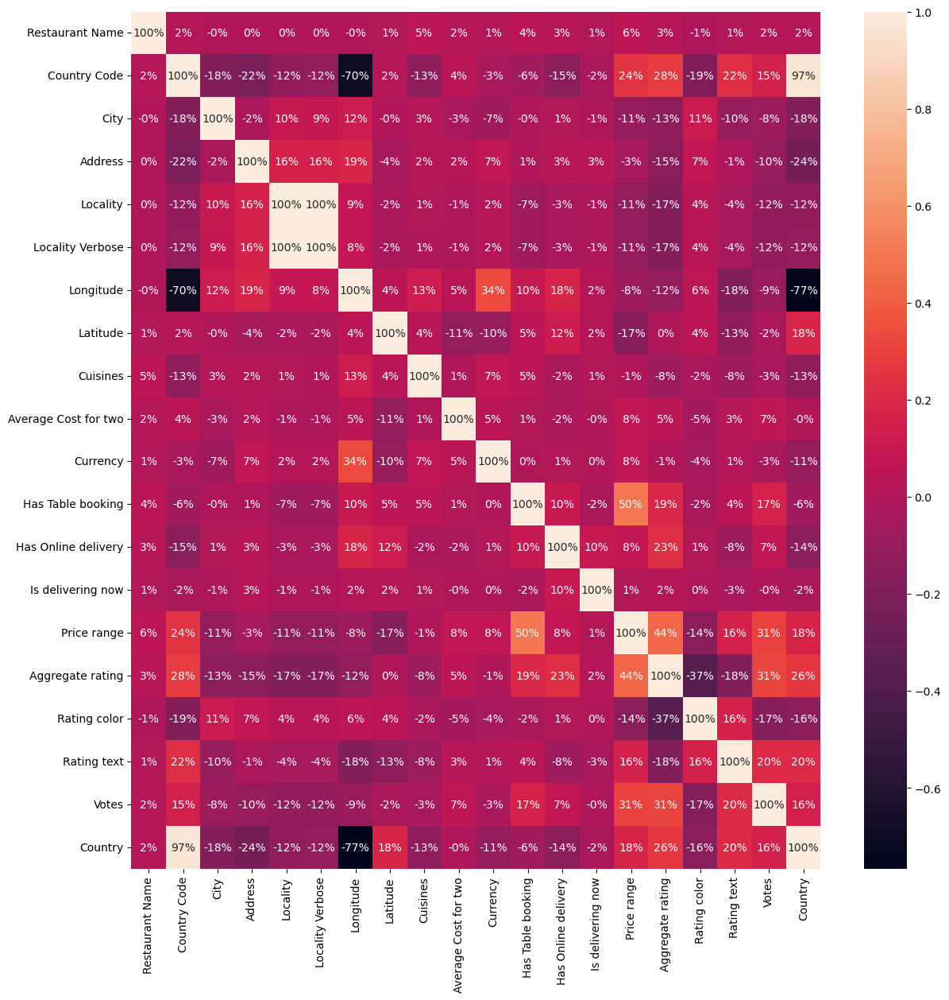

In [429]:
#Heatmap to show the correlation among the datas
plt.figure(figsize=(14,14))  
sns.heatmap(df.corr(), annot=True, fmt='.0%')

In [430]:
df.shape

(9551, 20)

Let's drop the Locality Verbose because we have 2 columns with 100% correlation i.e. Locality and Locality Verbose

In [431]:
df.drop(['Locality Verbose'], axis=1, inplace =True)

In [432]:
corrmatrix=df.corr()
corrmatrix['Average Cost for two'].sort_values(ascending=False)


Average Cost for two    1.000000
Price range             0.075083
Votes                   0.067783
Aggregate rating        0.051792
Longitude               0.045891
Currency                0.045615
Country Code            0.043225
Rating text             0.031439
Address                 0.022749
Restaurant Name         0.019241
Has Table booking       0.007758
Cuisines                0.005831
Is delivering now      -0.001862
Country                -0.004034
Locality               -0.012136
Has Online delivery    -0.018974
City                   -0.028838
Rating color           -0.049970
Latitude               -0.111088
Name: Average Cost for two, dtype: float64

In [433]:
corrmatrix['Price range'].sort_values(ascending=False)

Price range             1.000000
Has Table booking       0.501925
Aggregate rating        0.437944
Votes                   0.309444
Country Code            0.243327
Country                 0.178035
Rating text             0.164242
Has Online delivery     0.077918
Currency                0.075179
Average Cost for two    0.075083
Restaurant Name         0.061275
Is delivering now       0.010940
Cuisines               -0.005350
Address                -0.034952
Longitude              -0.078939
City                   -0.105759
Locality               -0.114459
Rating color           -0.140468
Latitude               -0.166688
Name: Price range, dtype: float64

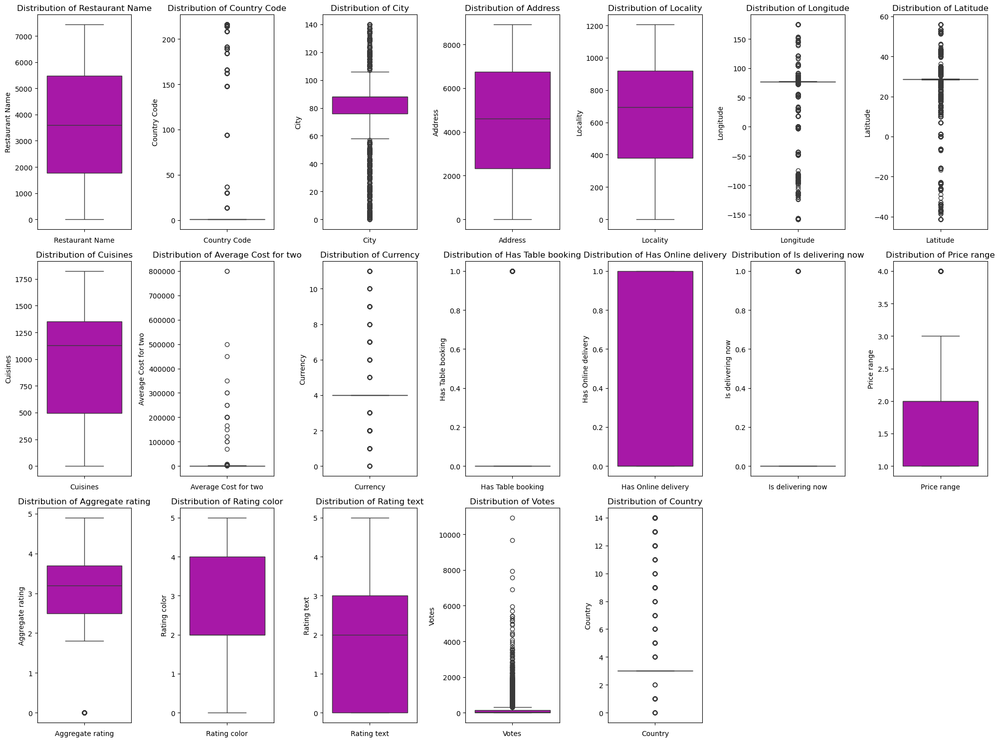

In [434]:
# checking the outliers

plt.figure(figsize=(20, 15),facecolor="white")
plotnumber=1
for i in df.columns[0:20]:
    if plotnumber<=20:
        plt.subplot(3, 7, plotnumber)
        sns.boxplot(df[i], color="m")
        plt.title(f'Distribution of {i}')
        plt.xlabel(i)
    plotnumber+=1
plt.tight_layout()
plt.show()

Outliers are presnt

In [435]:
#Removing the Outliers
from scipy.stats import zscore

z=np.abs(zscore(df))
print(np.where(z>3))

(array([   0,    1,    2, ..., 9549, 9550, 9550]), array([9, 9, 9, ..., 9, 1, 9]))


In [436]:
df_new=df[(z<3).all(axis=1)]
df_new

,Restaurant Name,Country Code,City,Address,Locality,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
456,5897,184,118,123,106,103.860005,1.282661,515,300,2,0,0,0,4,3.4,2,0,34,8
457,1829,184,118,1068,107,103.859422,1.285477,102,270,2,0,0,0,4,4.0,1,5,33,8
458,5319,184,118,2208,159,103.840360,1.279420,922,500,2,0,0,0,4,3.8,5,2,33,8
459,5006,184,118,1986,188,103.841669,1.280503,6,80,2,0,0,0,4,3.1,2,0,34,8
460,3189,184,118,1071,200,103.853605,1.293221,916,430,2,0,0,0,4,3.8,5,2,35,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9272,3364,1,134,7066,994,0.000000,0.000000,465,400,4,0,0,0,2,3.7,5,2,85,3
9273,4988,1,134,7009,994,83.315281,17.719539,322,600,4,0,0,0,2,4.3,1,5,172,3
9274,7201,1,134,8664,1081,83.336840,17.721182,88,1500,4,0,0,0,4,3.8,5,2,74,3
9275,2384,1,134,151,1169,83.314942,17.721119,1031,1400,4,0,0,0,3,4.4,1,5,316,3


In [437]:
print('shape before removing the outliers:',df.shape)
print('shape after removing the outliers:',df_new.shape)

shape before removing the outliers: (9551, 19)
shape after removing the outliers: (8408, 19)


In [438]:
#%data loss calculation
loss_percent=((9551-8408)/9551)*100
print(loss_percent)

11.967333263532614


11% data loss is not acceptable,so we will not go with outlier removal.

# Removing the Skewness

In [439]:
df.skew().sort_values()

Latitude                -3.081635
Longitude               -2.807328
City                    -1.193777
Aggregate rating        -0.954130
Cuisines                -0.307425
Locality                -0.253554
Address                 -0.040407
Restaurant Name          0.044637
Rating color             0.046009
Rating text              0.431408
Price range              0.889618
Has Online delivery      1.114620
Has Table booking        2.321100
Currency                 2.858093
Country Code             3.043965
Country                  3.312721
Votes                    8.807637
Is delivering now       16.673412
Average Cost for two    35.477915
dtype: float64

Latitude, Longitude, Aggregate rating which are continuous numerical columns has Skewness. So Let's remove the skewness.

In [440]:
skew1 =['Latitude', 'Longitude', 'Aggregate rating']

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

df[skew1] = scaler.fit_transform(df[skew1].values)
df[skew1].skew()

Latitude           -0.293200
Longitude          -0.803832
Aggregate rating   -0.610806
dtype: float64

In [441]:
df.head()

,Restaurant Name,Country Code,City,Address,Locality,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,3749,162,73,8685,171,2.498033,-1.602771,920,1100,0,1,0,0,3,1.833264,0,1,314,6
1,3173,162,73,6055,593,2.497306,-1.603989,1111,1200,0,1,0,0,3,1.506121,0,1,591,6
2,2897,162,75,4684,308,2.499617,-1.601115,1671,4000,0,1,0,0,4,1.400030,1,5,270,6
3,4707,162,75,8690,862,2.499598,-1.600709,1126,1500,0,0,0,0,4,1.945248,0,1,365,6
4,5523,162,75,8689,862,2.499653,-1.600799,1122,1500,0,1,0,0,4,1.833264,0,1,229,6


# For target variable: Average Cost for two

Checking the Multicollinearity 

In [442]:
df1=df

In [443]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [444]:
x = df.drop(['Average Cost for two'], axis =1)
y= data['Average Cost for two']

In [445]:
vif= pd.DataFrame()
vif["VIF"]= [variance_inflation_factor(x.values,i)for i in range(x.shape[1])]
vif["Features"] = x.columns
vif

,VIF,Features
0,3.882827,Restaurant Name
1,16.669620,Country Code
2,11.595207,City
3,4.393236,Address
4,5.629397,Locality
5,1.990642,Longitude
6,1.657496,Latitude
7,4.827439,Cuisines
8,15.384702,Currency
9,1.642788,Has Table booking


In [446]:
df.drop(['Country'],axis=1,inplace=True)

In [447]:
x=df.drop(['Average Cost for two'], axis =1)

In [448]:
vif= pd.DataFrame()
vif["VIF"]= [variance_inflation_factor(x.values,i)for i in range(x.shape[1])]
vif["Features"] = x.columns
vif

,VIF,Features
0,3.800147,Restaurant Name
1,2.331744,Country Code
2,9.878106,City
3,4.345634,Address
4,5.393469,Locality
5,1.485708,Longitude
6,1.222624,Latitude
7,4.633416,Cuisines
8,14.029155,Currency
9,1.640551,Has Table booking


# Feature Scaling

In [449]:
#Using StandardScaler to scale the data
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=scaler.fit_transform(x)
x

array([[ 0.0447056 ,  2.53111053, -0.22853276, ..., -1.97785894,
        -0.4654417 ,  0.36520164],
       [-0.22410085,  2.53111053, -0.22853276, ..., -1.97785894,
        -0.4654417 ,  1.0091681 ],
       [-0.35290395,  2.53111053, -0.14231731, ..., -1.30805322,
         1.89507002,  0.26291094],
       ...,
       [-0.27263535,  3.34171786,  2.65968456, ...,  1.37116966,
         0.12468623,  1.17190331],
       [-1.46546399,  3.34171786,  2.65968456, ..., -1.30805322,
         1.89507002,  1.72985259],
       [ 1.67387805,  3.34171786,  2.65968456, ..., -1.30805322,
         1.89507002,  1.0091681 ]])

In [450]:
y.value_counts()

Average Cost for two
500       900
300       897
400       857
200       687
600       652
         ... 
8000        1
2350        1
150000      1
70000       1
545         1
Name: count, Length: 140, dtype: int64

In [451]:
#Using multiple Algorithms for calculating the best algo which suits best for our data set
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor, ExtraTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.linear_model import Lasso,Ridge,ElasticNet

from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.model_selection import train_test_split


#Finding best Random state
maxR2S=0
maxRS=0
for i in range(50,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=i)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    predlr=lr.predict(x_test)
    r2score=r2_score(y_test,predlr)
    if r2score>maxR2S:
        maxR2S=r2score
        maxRS=i
print('Best accuracy is',maxR2S,'on Random_state',maxRS)


Best accuracy is 0.07321097203852323 on Random_state 85


In [452]:
#Model Building
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=85)

In [453]:
from sklearn.model_selection import cross_val_score

model=[LinearRegression(),DecisionTreeRegressor(),ExtraTreeRegressor(),KNeighborsRegressor(n_neighbors= 13), AdaBoostRegressor(),GradientBoostingRegressor(),RandomForestRegressor(), Lasso(alpha=.00001),Ridge(alpha=.00001),ElasticNet(alpha=.00001)]

for m in model:
    m.fit(x_train,y_train)
    predm=m.predict(x_test)
    print("error:")
    print("Mean squared error:", mean_squared_error(y_test, predm))
    print("Mean absolute error:", mean_absolute_error(y_test, predm))
    print("Root Mean squared error:", np.sqrt(mean_squared_error(y_test, predm)))
    print("R2 Score of ",m,"is: ",r2_score(y_test, predm))
    sc=cross_val_score(m,x,y,cv=5,scoring='r2')
    print('Cross validation score of',m,"is: ",sc.mean())
    print("Difference between r2 score and cross validation score is", r2_score(y_test, predm)-sc.mean())
    print()
    print()
    print()
    print("------------------------------------------------------")   

error:
Mean squared error: 128452122.99359617
Mean absolute error: 1977.6872397285
Root Mean squared error: 11333.67208779203
R2 Score of  LinearRegression() is:  0.07321097203852323
Cross validation score of LinearRegression() is:  -1250.2870539144865
Difference between r2 score and cross validation score is 1250.360264886525



------------------------------------------------------
error:
Mean squared error: 343137827.0150035
Mean absolute error: 989.12247034194
Root Mean squared error: 18523.979783378178
R2 Score of  DecisionTreeRegressor() is:  -1.475758015863255
Cross validation score of DecisionTreeRegressor() is:  -7211.666948744353
Difference between r2 score and cross validation score is 7210.19119072849



------------------------------------------------------
error:
Mean squared error: 368924731.149686
Mean absolute error: 895.8426378227495
Root Mean squared error: 19207.413442462417
R2 Score of  ExtraTreeRegressor() is:  -1.6618119265355578
Cross validation score of ExtraTr

Best Model is KNeighborsRegressor which has highest r2 score 82.31% and also has the minimum difference between r2 score and cross validation score i.e. 31.75

# HyperParameter Tuning

In [454]:
#Hyperparameter tuning
from sklearn.model_selection import GridSearchCV
#Setting values for the parameters


parameters = {
             'algorithm' : ['auto', 'ball_tree', 'kd_tree'],
             'leaf_size' : [30,40,25],
             'n_neighbors' : [13],
             'weights': ['uniform', 'distance']
}

grid_search = GridSearchCV(estimator =KNeighborsRegressor(n_neighbors= 13), param_grid=parameters, cv=5)
grid_search.fit(x_train, y_train)
print(grid_search.best_params_)


{'algorithm': 'auto', 'leaf_size': 30, 'n_neighbors': 13, 'weights': 'uniform'}


In [455]:
FinalModel=KNeighborsRegressor(n_neighbors= 13, algorithm='auto', leaf_size= 30,weights='uniform')
FinalModel.fit(x_train,y_train)
y_pred=FinalModel.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.8231502117416379
Mean absolute error: 387.3073165494659
Mean square error: 24511221.073388472
Root mean square error: 4950.880838132592


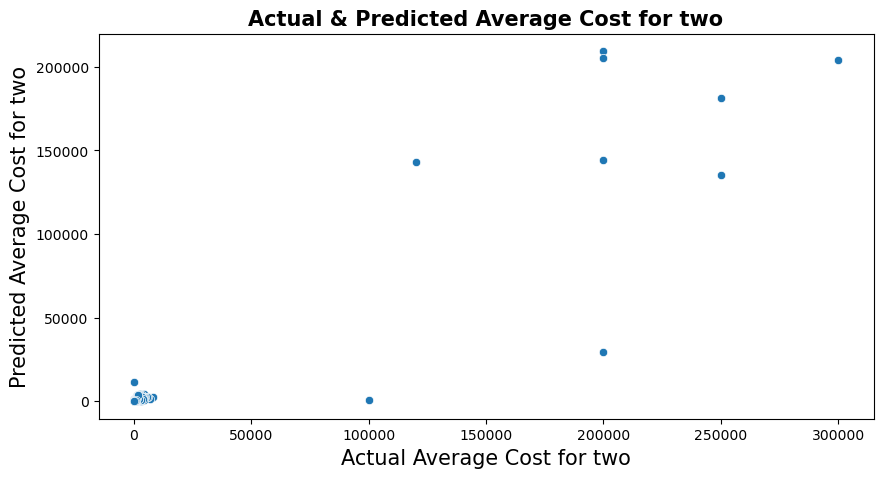

In [456]:
# Let's visualize the variation of actual test data and predicted data
plt.figure(figsize=(10,5))
sns.scatterplot(x=y_test.round(2), y=y_pred)
plt.xlabel("Actual Average Cost for two", fontsize= 15)
plt.ylabel("Predicted Average Cost for two",fontsize= 15)
plt.title("Actual & Predicted Average Cost for two" , fontsize= 15, fontweight= 'bold')
plt.show()

In [458]:
import pickle
filename='Zomato_AverageCostfortwo_Regressor.pkl'
pickle.dump(FinalModel,open(filename,'wb'))

In [459]:
loaded_model=pickle.load(open('Zomato_AverageCostfortwo_Regressor.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)

82.31502117416379


In [460]:
conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],y_test[:]],index=("predicted","original"))
conclusion

0           1           2           3           4     \
predicted  696.153846  211.538462  292.307692  403.846154  580.769231   
original   550.000000  200.000000  200.000000  500.000000  600.000000   

                 5           6           7           8            9     \
predicted  569.230769  353.846154  170.384615  253.846154  2096.153846   
original   400.000000  400.000000  260.000000  200.000000  1600.000000   

                10          11          12           13          14    \
predicted  29.615385  284.615385  569.230769  1265.384615  615.384615   
original   70.000000  100.000000  500.000000   800.000000  650.000000   

                  15           16           17         18          19    \
predicted   707.692308  1003.846154  1538.461538  20.384615  276.923077   
original   1100.000000   850.000000  1800.000000  25.000000  100.000000   

                 20           21          22           23           24    \
predicted  492.307692  2707.692308  242.307692  1273.076923  4176.923077   
original   650.000000  8000.000000  250.000000   900.000000  2650.000000   

                 25           26          27          28         29    \
predicted  292.307692   661.538462  542.307692  292.307692  35.769231   
original   300.000000  1000.000000  500.000000  350.000000  40.000000   

                 30          31             32          33          34    \
predicted  311.538462  496.153846  181288.461538  392.307692  265.384615   
original   450.000000  500.000000  250000.000000  500.000000  450.000000   

                 35          36           37          38          39    \
predicted  373.076923  357.692308  1411.538462  276.923077  326.923077   
original   350.000000  600.000000  1500.000000  150.000000  400.000000   

                 40           41          42          43         44    \
predicted  253.846154  2065.384615  626.923077  576.923077  15.769231   
original   300.000000  2100.000000  650.000000  500.000000  10.000000   

                45          46          47         48          49    \
predicted  58.461538  215.384615  303.846154  29.615385  615.384615   
original   20.000000  100.000000  400.000000  25.000000  700.000000   

                 50           51          52           53          54    \
predicted  307.692308  3992.307692  592.307692  1134.615385  265.384615   
original   250.000000  4500.000000  700.000000  1800.000000  450.000000   

                 55          56          57          58          59    \
predicted  611.538462  284.615385  569.230769  276.923077  284.615385   
original   800.000000  300.000000  500.000000  100.000000  100.000000   

                 60          61          62          63          64    \
predicted  326.923077  269.230769  407.692308  438.461538  257.692308   
original   400.000000  300.000000  400.000000  300.000000  300.000000   

                 65          66          67          68          69    \
predicted  280.769231  288.461538  553.846154  273.076923  284.615385   
original   250.000000  200.000000  500.000000  400.000000  100.000000   

                 70          71          72      73          74     75    \
predicted  261.538462  230.769231  573.076923  2150.0  919.230769  600.0   
original   300.000000  350.000000  500.000000  3000.0  800.000000  700.0   

                 76          77          78          79          80    \
predicted   60.769231  353.846154  676.923077  296.153846  380.769231   
original   190.000000  450.000000  500.000000  300.000000  350.000000   

                 81          82          83          84          85    \
predicted  257.692308  630.769231  596.153846  907.692308  530.769231   
original   300.000000  700.000000  600.000000  900.000000  500.000000   

                 86          87          88         89           90    \
predicted  311.538462  311.538462  434.615385  20.769231  1111.538462   
original   450.000000  150.000000  350.000000  10.000000  1900.000000   

                 9

# For target variable: Price range

Checking the Multicollinearity

In [461]:
x1= df1.drop(['Price range'], axis =1)
y1= df1['Price range']

In [462]:

vif=pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(x1.values,i)for i in range(x1.shape[1])]
vif['Features']= x1.columns
vif

,VIF,Features
0,3.776736,Restaurant Name
1,2.233849,Country Code
2,9.759963,City
3,4.305798,Address
4,5.383288,Locality
5,1.507421,Longitude
6,1.193568,Latitude
7,4.589888,Cuisines
8,1.046601,Average Cost for two
9,13.001152,Currency


# Feature Scaling

In [463]:
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
x1= scaler.fit_transform(x1)


In [464]:
x1

array([[ 0.0447056 ,  2.53111053, -0.22853276, ..., -1.97785894,
        -0.4654417 ,  0.36520164],
       [-0.22410085,  2.53111053, -0.22853276, ..., -1.97785894,
        -0.4654417 ,  1.0091681 ],
       [-0.35290395,  2.53111053, -0.14231731, ..., -1.30805322,
         1.89507002,  0.26291094],
       ...,
       [-0.27263535,  3.34171786,  2.65968456, ...,  1.37116966,
         0.12468623,  1.17190331],
       [-1.46546399,  3.34171786,  2.65968456, ..., -1.30805322,
         1.89507002,  1.72985259],
       [ 1.67387805,  3.34171786,  2.65968456, ..., -1.30805322,
         1.89507002,  1.0091681 ]])

In [465]:
import sklearn
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

#Finding best Random state
maxAccu=0
maxRS=0
for i in range(1,500):
    x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=.30,random_state=i)
    dtc=DecisionTreeClassifier()
    dtc.fit(x_train,y_train)
    preddtc=dtc.predict(x_test)
    acc=accuracy_score(y_test,preddtc)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('Best accuracy is',maxAccu,'on Random_state',maxRS)

Best accuracy is 0.9870900209351012 on Random_state 434


In [466]:
#Model Building
x_train, x_test, y_train, y_test = train_test_split(x1, y1, test_size=0.30, random_state=434)

In [467]:
from sklearn.linear_model import LogisticRegression

model=[LogisticRegression(),DecisionTreeClassifier(),ExtraTreeClassifier(),KNeighborsClassifier(),SVC(),RandomForestClassifier(),GradientBoostingClassifier(),AdaBoostClassifier(),BaggingClassifier()]
for m in model:
    m.fit(x_train,y_train)
    predm=m.predict(x_test)
    print("Accuracy of",m,"is:   ",accuracy_score(y_test,predm))
    print(confusion_matrix(y_test,predm))
    print(classification_report(y_test,predm))
   
    scr=cross_val_score(m,x1,y1,cv=5,scoring='accuracy')
    print(scr.mean())
    print("Difference between accuracy score and cross validation score is", accuracy_score(y_test, predm)-scr.mean())

    print()
    print()
    print("-----------------------------------------------------")   

Accuracy of LogisticRegression() is:    0.64480111653873
[[1156  171    9    0]
 [ 395  425   97   11]
 [  26  152  214   43]
 [   7   36   71   53]]
              precision    recall  f1-score   support

           1       0.73      0.87      0.79      1336
           2       0.54      0.46      0.50       928
           3       0.55      0.49      0.52       435
           4       0.50      0.32      0.39       167

    accuracy                           0.64      2866
   macro avg       0.58      0.53      0.55      2866
weighted avg       0.63      0.64      0.63      2866

0.5962923937194693
Difference between accuracy score and cross validation score is 0.04850872281926066


-----------------------------------------------------
Accuracy of DecisionTreeClassifier() is:    0.9860432658757851
[[1333    3    0    0]
 [   4  916    7    1]
 [   0    7  416   12]
 [   0    0    6  161]]
              precision    recall  f1-score   support

           1       1.00      1.00      1.00  

DecisonTreeClassifier model has the highest accuracy which is 98.6% (this may be due to overfitting). so we also checked the cross validation of each model for actual accuracy. After Cross Validation, we found out that the minimum difference between the accuracy score and cross validation score is given by AdaBoostClassifier(). Final model is AdaBoostClassifier which has the 79.83% actual accuracy (accuracy score).

# Without Hyperparameter Tuning

In [468]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

abc=AdaBoostClassifier()
abc.fit(x_train,y_train)
predabc=abc.predict(x_test)
print("Training accuracy: ",abc.score(x_train,y_train))
 
print("Testing Accuracy is:   ",accuracy_score(y_test,predabc))
print("Confusion Matrix: \n ",confusion_matrix(y_test,predabc))
print("Classification Report: \n",classification_report(y_test,predabc))

print("Cross Validation of Bagging Classifier :")
scr=cross_val_score(abc,x1,y1,cv=5,scoring='accuracy')
print("score mean:",scr.mean())
print("Difference between accuracy score and cross validation score of Bagging Classifier is", accuracy_score(y_test, predabc)-scr.mean())


Training accuracy:  0.794016454749439
Testing Accuracy is:    0.7983251919050942
Confusion Matrix: 
  [[1294   42    0    0]
 [  14  900    5    9]
 [   0  342   48   45]
 [   0  101   20   46]]
Classification Report: 
               precision    recall  f1-score   support

           1       0.99      0.97      0.98      1336
           2       0.65      0.97      0.78       928
           3       0.66      0.11      0.19       435
           4       0.46      0.28      0.34       167

    accuracy                           0.80      2866
   macro avg       0.69      0.58      0.57      2866
weighted avg       0.80      0.80      0.76      2866

Cross Validation of Bagging Classifier :
score mean: 0.7754257659568057
Difference between accuracy score and cross validation score of Bagging Classifier is 0.022899425948288532


# With HyperParameter Tuning

In [469]:
#Hyperparameter tuning
from sklearn.model_selection import GridSearchCV
#Setting values for the parameters


parameters = {
    'n_estimators' :[50,100, 300, 500, 800, 1200],
    'algorithm' : ['SAMME.R','SAMME'],
    'learning_rate' :[0.001, 0.01, 0.1, 1, 10]
}

gridsearch = GridSearchCV(AdaBoostClassifier(), parameters,cv = 5, verbose = 1, n_jobs = -1)
gridsearch.fit(x_train, y_train)
print(gridsearch.best_params_)
print(gridsearch.best_score_)

Fitting 5 folds for each of 60 candidates, totalling 300 fits
{'algorithm': 'SAMME', 'learning_rate': 0.1, 'n_estimators': 800}
0.9518324607329843


In [470]:

#Fitting the AdaBoostClassifier model with the best hyper parameters obtained through GridSearchCV
FinalModel1=AdaBoostClassifier(n_estimators=800, algorithm='SAMME', learning_rate= 0.1)
FinalModel1.fit(x_train,y_train)
pred=FinalModel1.predict(x_test)
acc=accuracy_score(y_test,pred)
print('Accuracy score:',acc*100)
print("Confusion Matrix: \n ",confusion_matrix(y_test,pred))
print("Classification Report: \n",classification_report(y_test,pred))

Accuracy score: 95.11514305652477
Confusion Matrix: 
  [[1334    2    0    0]
 [  16  897   11    4]
 [   2   36  366   31]
 [   1    7   30  129]]
Classification Report: 
               precision    recall  f1-score   support

           1       0.99      1.00      0.99      1336
           2       0.95      0.97      0.96       928
           3       0.90      0.84      0.87       435
           4       0.79      0.77      0.78       167

    accuracy                           0.95      2866
   macro avg       0.91      0.89      0.90      2866
weighted avg       0.95      0.95      0.95      2866



In [471]:
import pickle
filename='Zomato_Pricerange_classification.pkl'
pickle.dump(FinalModel1,open(filename,'wb'))

In [472]:
import pickle
loaded_model1=pickle.load(open('Zomato_Pricerange_classification.pkl','rb'))
result1=loaded_model1.score(x_test,y_test)
print(result1*100)

95.11514305652477


In [473]:
conclusion=pd.DataFrame([loaded_model1.predict(x_test)[:],y_test[:]],index=("predicted","original"))
conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021